# Traitement de video projet

- **Authors:** Rania, Ilhame, Brahim 

- **Project:** Anonymisation vidéo avec préservation sémantique multi-niveaux pour des applications centrées sur l’humain et respectueuses de la vie privée

- **Numero:** 5

## 1. Imports et Configuration

In [62]:
%matplotlib inline

# Imports standards
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from pathlib import Path
import sys
from IPython.display import Image, display
import warnings
warnings.filterwarnings('ignore')

# Imports deep learning
import insightface
from insightface.app import FaceAnalysis

# Imports modules du projet
sys.path.append(str(Path.cwd()))
from face_swapper import FaceSwapper
from temporal_filter import TemporalFilter, AdaptiveTemporalFilter
from video_analyzer import VideoAnalyzer
from audio_anonymizer_v2 import AudioAnonymizerV2

# Configuration matplotlib
plt.rcParams['figure.figsize'] = (15, 8)
plt.rcParams['font.size'] = 10

print(" Tous les modules importés avec succès!")
print(f"Backend matplotlib: {matplotlib.get_backend()}")

 Tous les modules importés avec succès!
Backend matplotlib: inline


## 2. Chargement Vidéo et Extraction Frame

In [48]:
# Charger une vidéo de test
video_path = "input_videos/video3.mp4"
cap = cv2.VideoCapture(video_path)

# Informations vidéo
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

print(f"   Vidéo: {video_path}")
print(f"   Résolution: {width}x{height}")
print(f"   FPS: {fps}")
print(f"   Nombre de frames: {frame_count}")
print(f"   Durée: {frame_count/fps:.2f}s")


   Vidéo: input_videos/video3.mp4
   Résolution: 478x850
   FPS: 30.0
   Nombre de frames: 79
   Durée: 2.63s


##  3. Détection de Visages avec InsightFace

Utilisation du modèle **buffalo_l** pour une détection précise avec landmarks.

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\PC/.insightface\models\buffalo_l\1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\PC/.insightface\models\buffalo_l\2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\PC/.insightface\models\buffalo_l\det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\PC/.insightface\models\buffalo_l\genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\PC/.insightface\models\buffalo_l\w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det

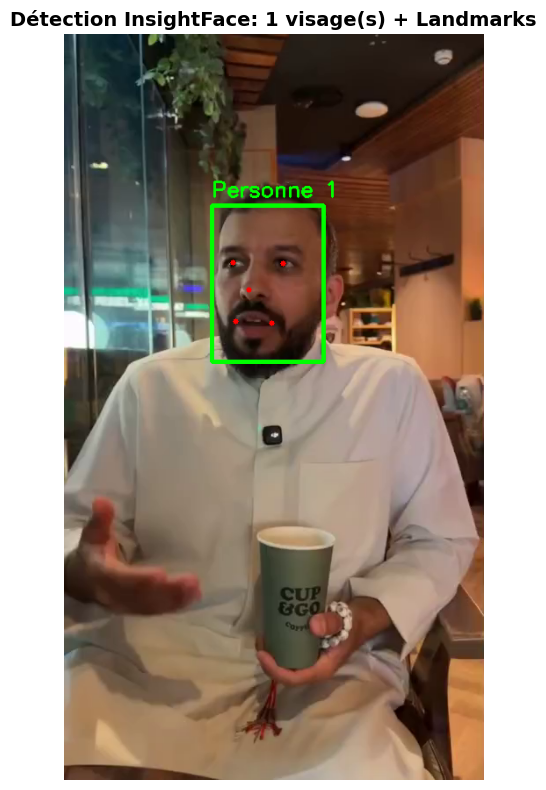


  Informations du premier visage:
   Bounding Box: [168.47606 195.91322 295.7818  373.2494 ]
   Confiance: 0.872
   Embedding shape: (512,)
   Âge estimé: 40
   Genre: Homme


In [25]:
# Initialiser InsightFace
app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
app.prepare(ctx_id=0, det_size=(640, 640))

# Détecter les visages
faces = app.get(frame_rgb)

print(f" {len(faces)} visage(s) détecté(s)")

# Visualisation avec bounding boxes et landmarks
frame_detected = frame_rgb.copy()

for i, face in enumerate(faces):
    # Bounding box
    bbox = face.bbox.astype(int)
    cv2.rectangle(frame_detected, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 255, 0), 3)
    
    # Landmarks (5 points: yeux, nez, coins bouche)
    if hasattr(face, 'kps') and face.kps is not None:
        for kp in face.kps.astype(int):
            cv2.circle(frame_detected, tuple(kp), 3, (255, 0, 0), -1)
    
    # Label
    cv2.putText(frame_detected, f"Personne {i+1}", (bbox[0], bbox[1]-10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

plt.figure(figsize=(15, 8))
plt.imshow(frame_detected)
plt.title(f"Détection InsightFace: {len(faces)} visage(s) + Landmarks", fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

# Afficher les informations détaillées
if faces:
    face = faces[0]
    print("\n  Informations du premier visage:")
    print(f"   Bounding Box: {face.bbox}")
    print(f"   Confiance: {face.det_score:.3f}")
    print(f"   Embedding shape: {face.embedding.shape}")
    print(f"   Âge estimé: {face.age if hasattr(face, 'age') else 'N/A'}")
    print(f"   Genre: {'Homme' if hasattr(face, 'gender') and face.gender == 1 else 'Femme' if hasattr(face, 'gender') else 'N/A'}")

##  4. Anonymisation Visage: 4 Méthodes

### 4.1 Méthode 1: Blur (Floutage Gaussien)

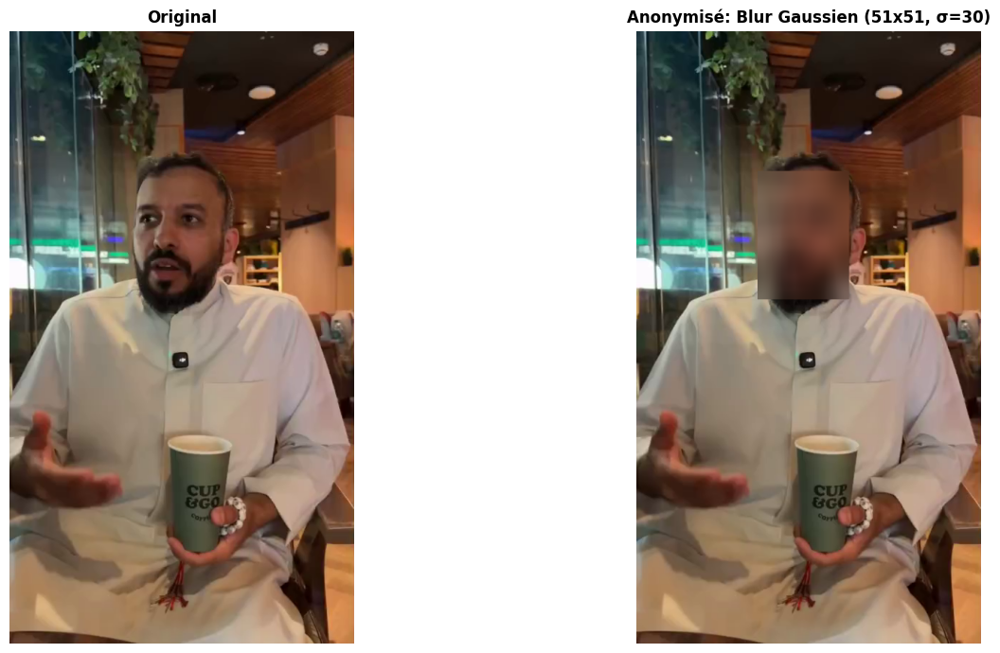

 Méthode 1 (Blur): Anonymisation forte, perte de détails


In [26]:
# Appliquer le blur sur les visages détectés
frame_blurred = frame_rgb.copy()

for face in faces:
    bbox = face.bbox.astype(int)
    x1, y1, x2, y2 = bbox
    
    # Extraire la région du visage
    face_region = frame_blurred[y1:y2, x1:x2]
    
    # Appliquer un flou gaussien fort
    blurred_face = cv2.GaussianBlur(face_region, (51, 51), 30)
    
    # Remplacer dans l'image
    frame_blurred[y1:y2, x1:x2] = blurred_face

# Comparaison visuelle
plt.figure(figsize=(16, 7))

plt.subplot(1, 2, 1)
plt.imshow(frame_rgb)
plt.title("Original", fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(frame_blurred)
plt.title("Anonymisé: Blur Gaussien (51x51, σ=30)", fontsize=12, fontweight='bold')
plt.axis('off')

plt.tight_layout()
plt.show()

print(" Méthode 1 (Blur): Anonymisation forte, perte de détails")

Traitement de 6 frames avec Blur...


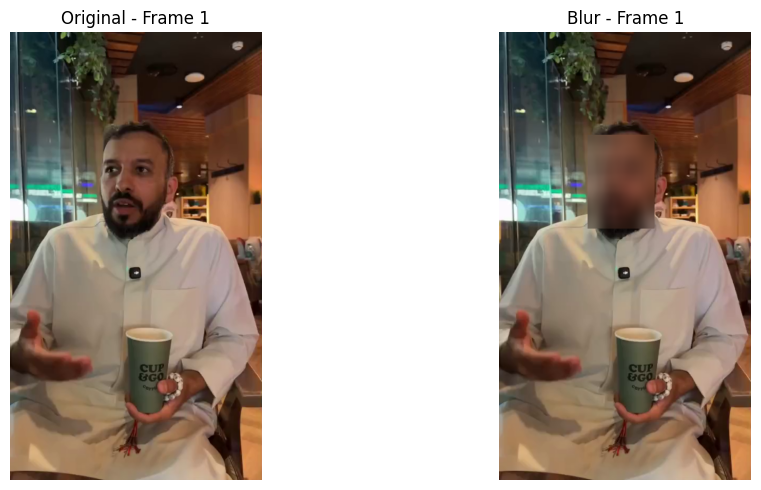

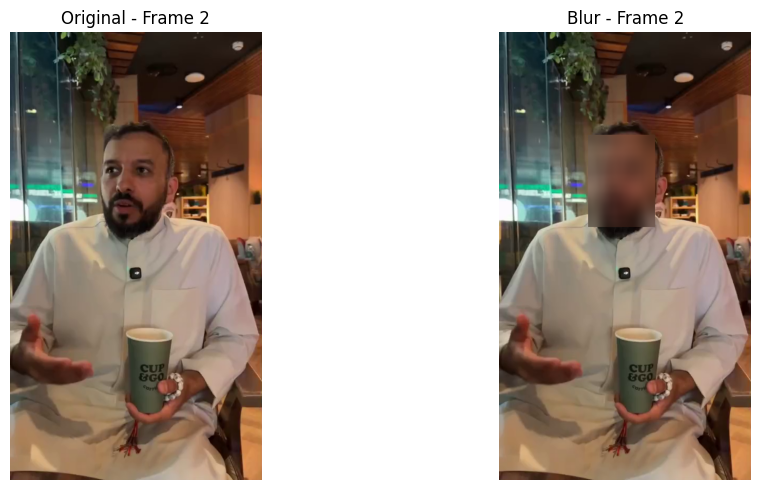

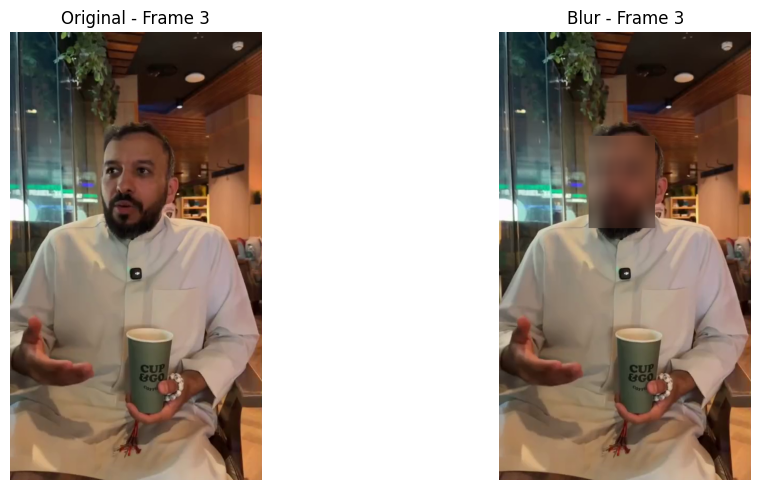

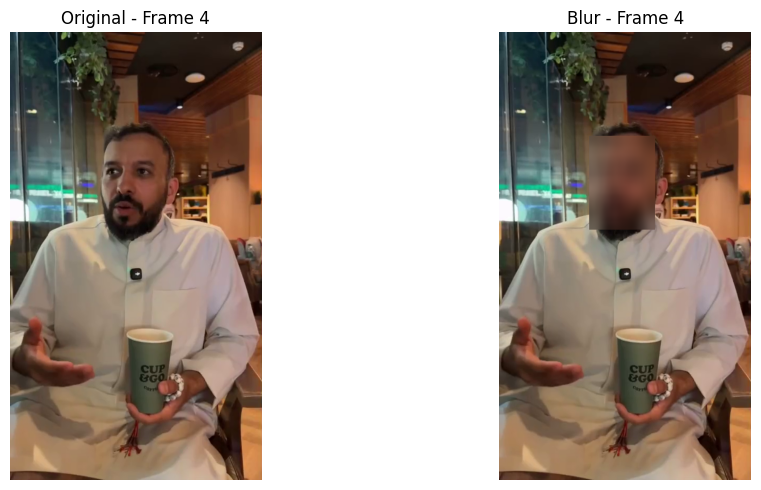

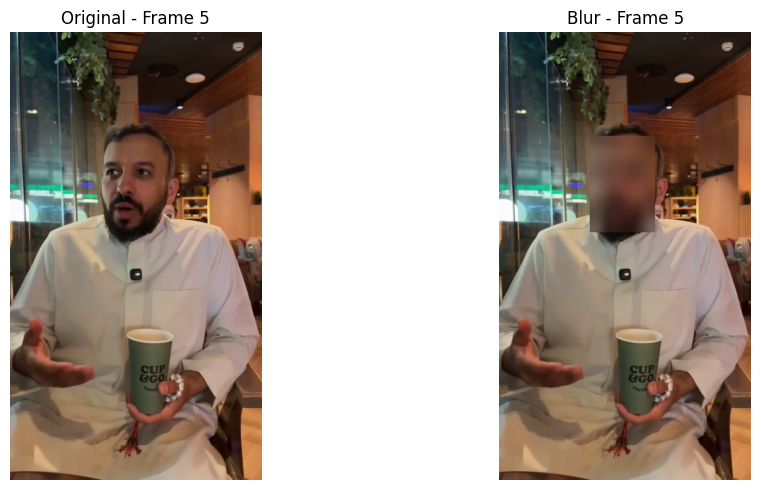

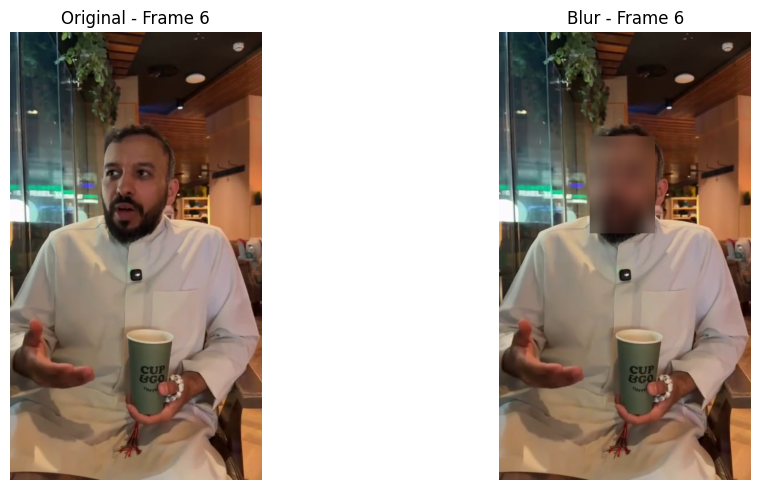

6 frames traitees avec succes


In [27]:
# Traiter une séquence de 6 frames avec Blur
cap = cv2.VideoCapture(video_path)
num_frames = 6
frames_original = []
frames_blurred_seq = []

print(f"Traitement de {num_frames} frames avec Blur...")

for i in range(num_frames):
    ret, frame = cap.read()
    if not ret:
        break
    
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frames_original.append(frame_rgb)
    
    # Appliquer blur
    frame_blur = frame_rgb.copy()
    faces_seq = app.get(frame_rgb)
    
    for face in faces_seq:
        bbox = face.bbox.astype(int)
        x1, y1, x2, y2 = bbox
        face_region = frame_blur[y1:y2, x1:x2]
        blurred = cv2.GaussianBlur(face_region, (51, 51), 30)
        frame_blur[y1:y2, x1:x2] = blurred
    
    frames_blurred_seq.append(frame_blur)

cap.release()

# Visualisation cote a cote
for i in range(num_frames):
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(frames_original[i])
    plt.title(f"Original - Frame {i+1}")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(frames_blurred_seq[i])
    plt.title(f"Blur - Frame {i+1}")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

print(f"{len(frames_blurred_seq)} frames traitees avec succes")

####  Test sur Séquence Vidéo: Blur

Comparaison sur plusieurs frames pour voir l'effet en mouvement

In [28]:
# Creer et sauvegarder une video complete avec Blur
from pathlib import Path

# Creer le dossier de sortie
output_dir = Path("output_videos")
output_dir.mkdir(exist_ok=True)

output_video_blur = str(output_dir / "video3_blur.mp4")

# Ouvrir la video source
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Creer le VideoWriter
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video_blur, fourcc, fps, (width, height))

print(f"Creation de la video avec Blur...")
frame_count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break
    
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    faces_detected = app.get(frame_rgb)
    
    # Appliquer blur
    for face in faces_detected:
        bbox = face.bbox.astype(int)
        x1, y1, x2, y2 = bbox
        face_region = frame_rgb[y1:y2, x1:x2]
        blurred = cv2.GaussianBlur(face_region, (51, 51), 30)
        frame_rgb[y1:y2, x1:x2] = blurred
    
    # Convertir en BGR pour ecriture
    frame_bgr = cv2.cvtColor(frame_rgb, cv2.COLOR_RGB2BGR)
    out.write(frame_bgr)
    frame_count += 1

cap.release()
out.release()

print(f"Video creee: {output_video_blur} ({frame_count} frames)")

Creation de la video avec Blur...
Video creee: output_videos\video3_blur.mp4 (79 frames)


### 4.2 Méthode 2: Pixelisation

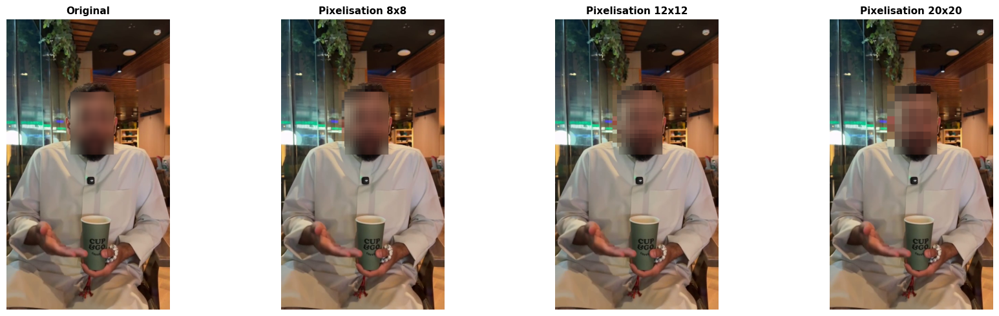

 Méthode 2 (Pixelate): Effet rétro, anonymisation progressive


In [29]:
def pixelate_region(image, pixel_size=10):
    """Pixelise une région d'image"""
    h, w = image.shape[:2]
    if h == 0 or w == 0:
        return image
    
    # Réduire la résolution
    small = cv2.resize(image, (max(1, w // pixel_size), max(1, h // pixel_size)), 
                      interpolation=cv2.INTER_LINEAR)
    
    # Agrandir avec interpolation nearest pour effet pixelisé
    pixelated = cv2.resize(small, (w, h), interpolation=cv2.INTER_NEAREST)
    
    return pixelated

# Appliquer la pixelisation
frame_pixelated = frame_rgb.copy()

for face in faces:
    bbox = face.bbox.astype(int)
    x1, y1, x2, y2 = bbox
    
    face_region = frame_pixelated[y1:y2, x1:x2]
    pixelated_face = pixelate_region(face_region, pixel_size=15)
    frame_pixelated[y1:y2, x1:x2] = pixelated_face

# Comparaison avec différents niveaux de pixelisation
pixel_sizes = [8, 12, 20]
frames_pixel = []

for psize in pixel_sizes:
    frame_temp = frame_rgb.copy()
    for face in faces:
        bbox = face.bbox.astype(int)
        x1, y1, x2, y2 = bbox
        face_region = frame_temp[y1:y2, x1:x2]
        pixelated_face = pixelate_region(face_region, pixel_size=psize)
        frame_temp[y1:y2, x1:x2] = pixelated_face
    frames_pixel.append(frame_temp)

# Visualisation
plt.figure(figsize=(18, 5))

plt.subplot(1, 4, 1)
plt.imshow(frame_rgb)
plt.title("Original", fontsize=11, fontweight='bold')
plt.axis('off')

for i, (frame_p, psize) in enumerate(zip(frames_pixel, pixel_sizes)):
    plt.subplot(1, 4, i+2)
    plt.imshow(frame_p)
    plt.title(f"Pixelisation {psize}x{psize}", fontsize=11, fontweight='bold')
    plt.axis('off')

plt.tight_layout()
plt.show()

print(" Méthode 2 (Pixelate): Effet rétro, anonymisation progressive")

 Traitement de 6 frames avec Pixelisation...


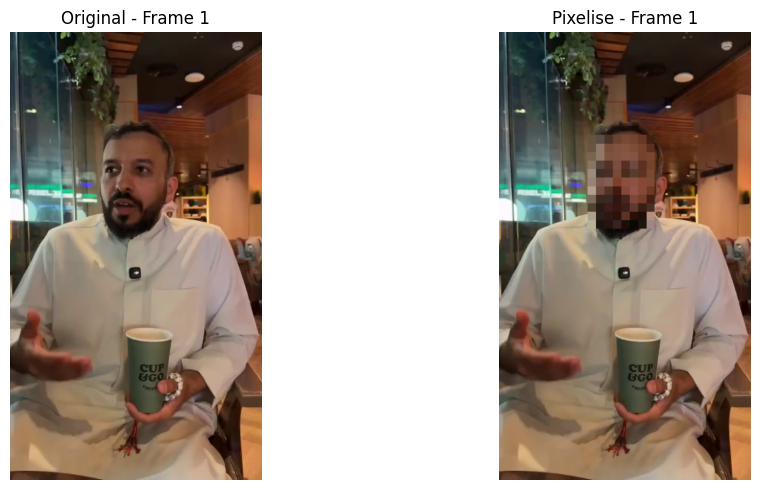

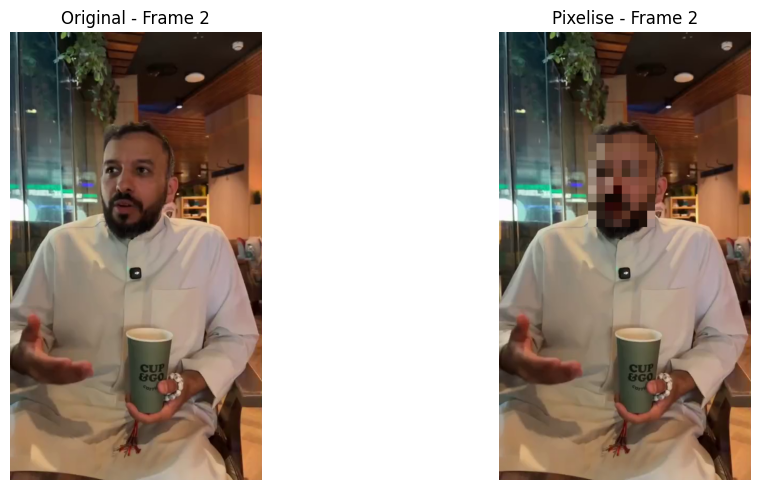

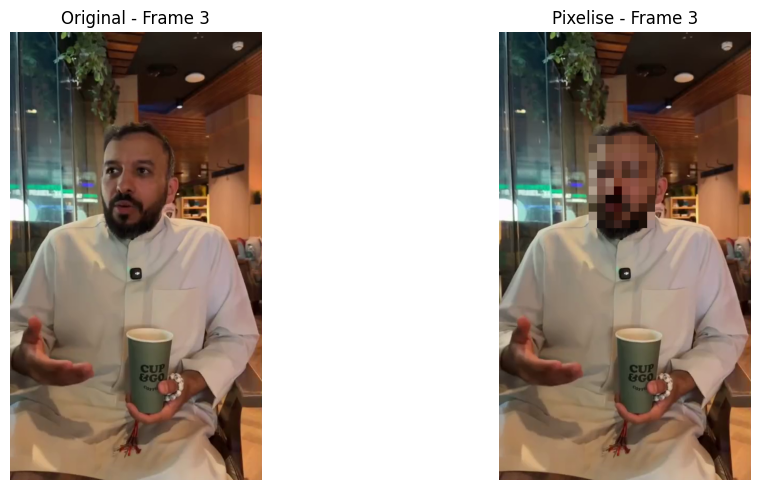

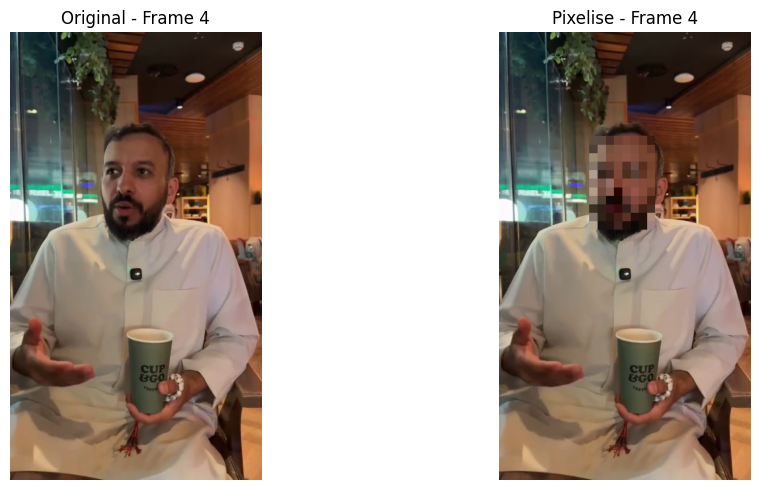

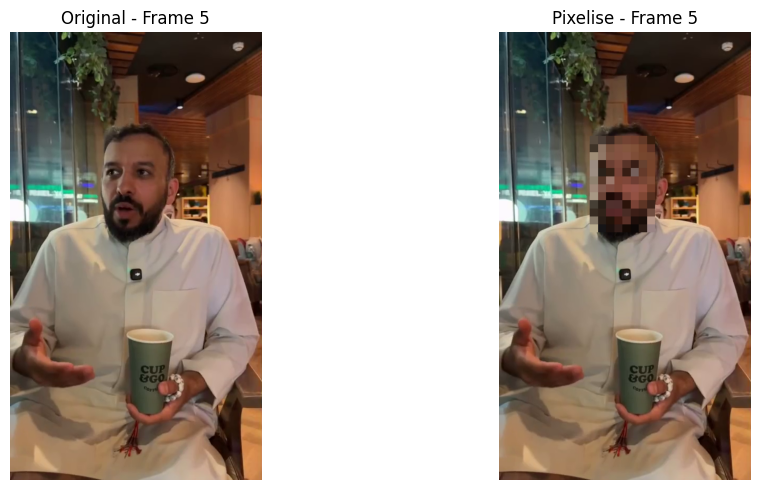

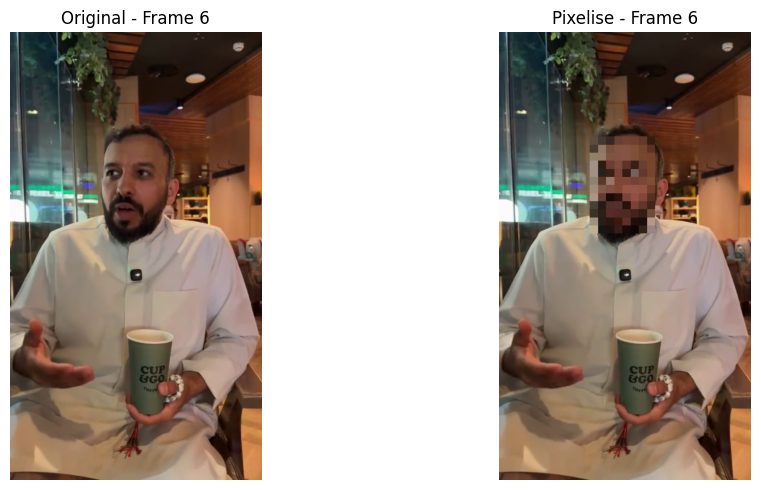

6 frames traitees avec succes


In [30]:
# Traiter une séquence avec Pixelisation
cap = cv2.VideoCapture(video_path)
frames_pixelated_seq = []

print(f" Traitement de {num_frames} frames avec Pixelisation...")

for i in range(num_frames):
    ret, frame = cap.read()
    if not ret:
        break
    
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Appliquer pixelisation
    frame_pixel = frame_rgb.copy()
    faces_seq = app.get(frame_rgb)
    
    for face in faces_seq:
        bbox = face.bbox.astype(int)
        x1, y1, x2, y2 = bbox
        face_region = frame_pixel[y1:y2, x1:x2]
        pixelated = pixelate_region(face_region, pixel_size=15)
        frame_pixel[y1:y2, x1:x2] = pixelated
    
    frames_pixelated_seq.append(frame_pixel)

cap.release()

# Visualisation cote a cote
for i in range(num_frames):
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(frames_original[i])
    plt.title(f"Original - Frame {i+1}")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(frames_pixelated_seq[i])
    plt.title(f"Pixelise - Frame {i+1}")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

print(f"{len(frames_pixelated_seq)} frames traitees avec succes")

####  Test sur Séquence Vidéo: Pixelisation

Effet progressif sur plusieurs frames

In [31]:
# Creer et sauvegarder une video complete avec Pixelisation
output_video_pixel = str(output_dir / "video3_pixelated.mp4")

cap = cv2.VideoCapture(video_path)
out = cv2.VideoWriter(output_video_pixel, fourcc, fps, (width, height))

print(f"Creation de la video avec Pixelisation...")
frame_count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break
    
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    faces_detected = app.get(frame_rgb)
    
    # Appliquer pixelisation
    for face in faces_detected:
        bbox = face.bbox.astype(int)
        x1, y1, x2, y2 = bbox
        face_region = frame_rgb[y1:y2, x1:x2]
        pixelated = pixelate_region(face_region, pixel_size=15)
        frame_rgb[y1:y2, x1:x2] = pixelated
    
    frame_bgr = cv2.cvtColor(frame_rgb, cv2.COLOR_RGB2BGR)
    out.write(frame_bgr)
    frame_count += 1

cap.release()
out.release()

print(f"Video creee: {output_video_pixel} ({frame_count} frames)")

Creation de la video avec Pixelisation...
Video creee: output_videos\video3_pixelated.mp4 (79 frames)


### 4.3 Méthode 3: Face Swap avec Préservation des Expressions 

**Innovation du projet:** Swap de visage avec blending des expressions originales (25% bouche + 25% yeux)

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
inswapper-shape: [1, 3, 128, 128]
 Visage de référence chargé: face_dataset/face1.jpg


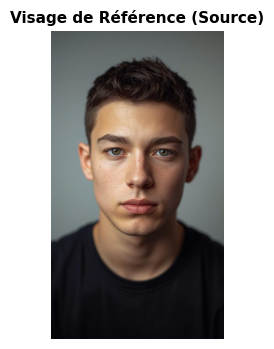

 Face Swap appliqué


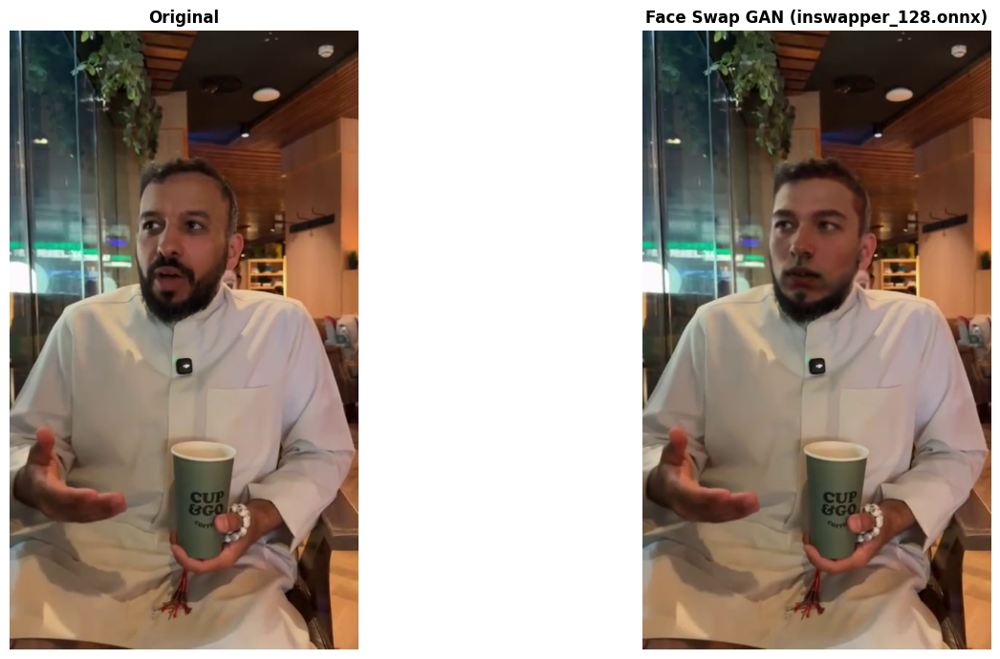

In [57]:
# Charger le swapper
swapper = insightface.model_zoo.get_model('models/inswapper_128.onnx', 
                                          providers=['CPUExecutionProvider'])

# Charger un visage de référence
ref_img_path = "face_dataset/face1.jpg"
ref_img = cv2.imread(ref_img_path)
ref_img_rgb = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)

# Détecter le visage de référence
ref_faces = app.get(ref_img_rgb)
if not ref_faces:
    print(" Aucun visage détecté dans l'image de référence")
else:
    ref_face = ref_faces[0]
    print(f" Visage de référence chargé: {ref_img_path}")
    
    # Afficher le visage de référence
    plt.figure(figsize=(4, 4))
    plt.imshow(ref_img_rgb)
    plt.title("Visage de Référence (Source)", fontsize=11, fontweight='bold')
    plt.axis('off')
    plt.show()
    
    # Appliquer le face swap 
    frame_swapped_basic = frame_rgb.copy()
    for face in faces:
        frame_swapped_basic = swapper.get(frame_swapped_basic, face, ref_face, paste_back=True)
    
    print(" Face Swap appliqué")
    
    # Comparaison
    plt.figure(figsize=(16, 7))
    
    plt.subplot(1, 2, 1)
    plt.imshow(frame_rgb)
    plt.title("Original", fontsize=12, fontweight='bold')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(frame_swapped_basic)
    plt.title("Face Swap GAN (inswapper_128.onnx)", fontsize=12, fontweight='bold')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

#### Face Swap AVEC Préservation des Expressions


 Initialisation du Face Swapper...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\PC/.insightface\models\buffalo_l\1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\PC/.insightface\models\buffalo_l\2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\PC/.insightface\models\buffalo_l\det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\PC/.insightface\models\buffalo_l\genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\PC/.insightface\models\buffalo_l\w600k_r50.onnx recognition ['None

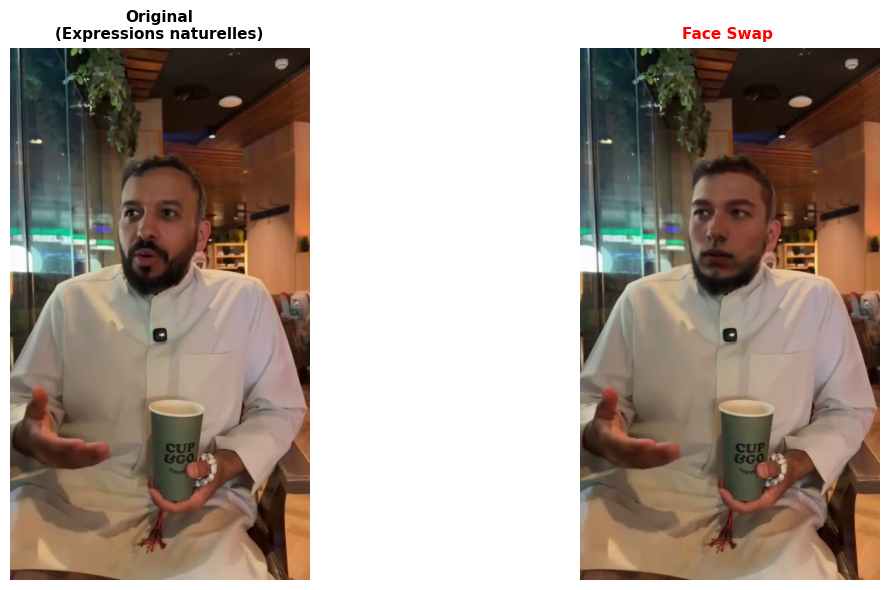

In [ ]:
# Utiliser le FaceSwapper du projet
face_swapper = FaceSwapper(face_dataset_path='face_dataset')

print("\n FaceSwapper initialisé avec:")
print("    Modèle: buffalo_l (détection)")
print("    Modèle: inswapper_128.onnx (swap GAN)")

# Appliquer le swap avec préservation
frame_swapped_preserved = face_swapper.swap_faces(frame_rgb, ref_face)

# Comparaison AVANT/APRÈS 
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(frame_rgb)
plt.title("Original\n(Expressions naturelles)", fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(frame_swapped_basic)
plt.title("Face Swap ", fontsize=11, fontweight='bold', color='red')
plt.axis('off')

plt.tight_layout()
plt.show()


 Traitement de 6 frames avec Face Swap + Préservation...


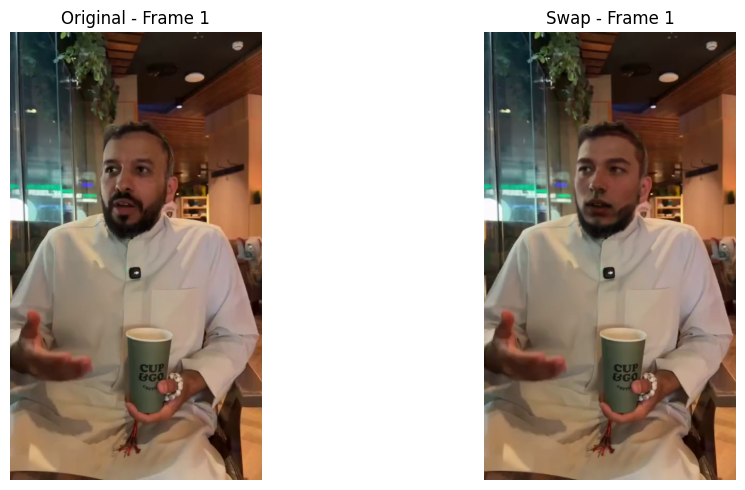

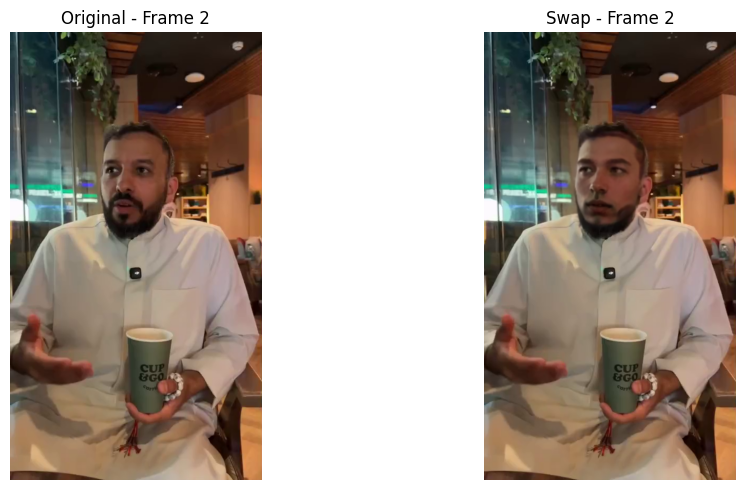

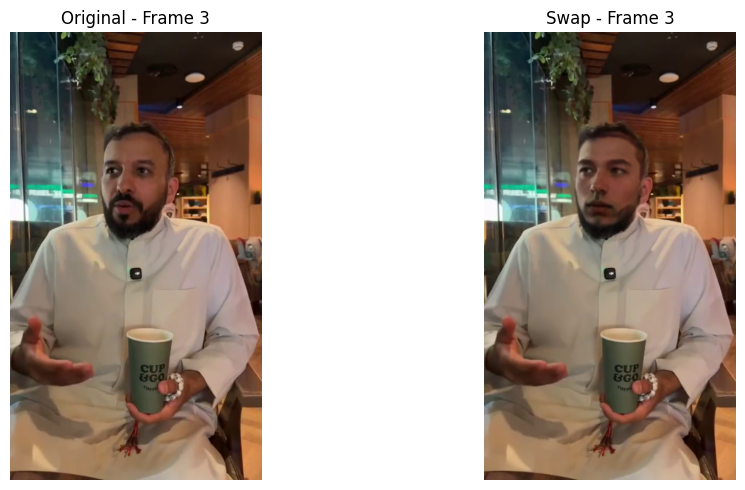

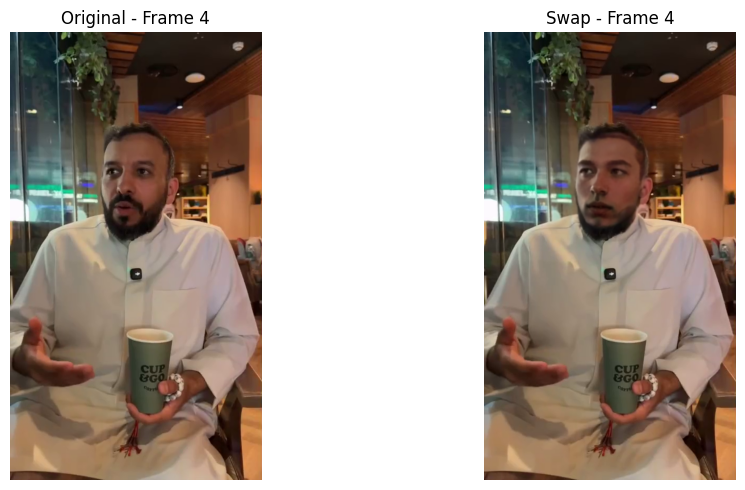

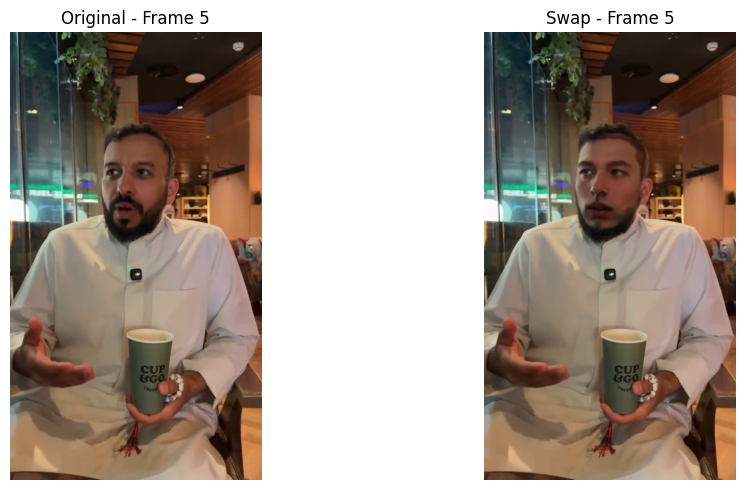

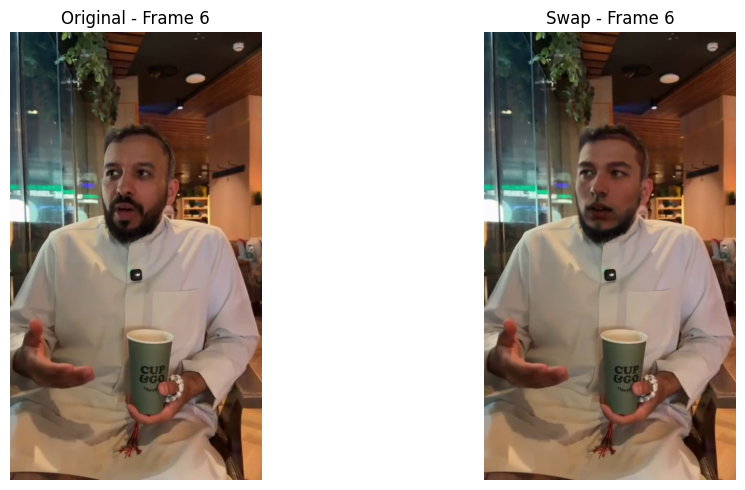

In [56]:
# Traiter une séquence avec Face Swap + Préservation
cap = cv2.VideoCapture(video_path)
frames_swapped_seq = []

print(f" Traitement de {num_frames} frames avec Face Swap + Préservation...")

for i in range(num_frames):
    ret, frame = cap.read()
    if not ret:
        break
    
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Appliquer face swap avec préservation
    frame_swap = face_swapper.swap_faces(frame_rgb, ref_face)
    frames_swapped_seq.append(frame_swap)

cap.release()

# Visualisation cote a cote
for i in range(num_frames):
    plt.figure(figsize=(15, 5))
    
    # Original
    plt.subplot(1, 3, 1)
    plt.imshow(frames_original[i])
    plt.title(f"Original - Frame {i+1}")
    plt.axis('off')
    
    # Swap 
    frame_basic = frames_original[i].copy()
    faces_temp = app.get(frames_original[i])
    for face in faces_temp:
        frame_basic = swapper.get(frame_basic, face, ref_face, paste_back=True)
    
    plt.subplot(1, 3, 2)
    plt.imshow(frame_basic)
    plt.title(f"Swap - Frame {i+1}")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()


####  Test sur Séquence Vidéo: Face Swap avec Préservation

Vérification de la fluidité des expressions sur plusieurs frames

In [ ]:
# Creer et sauvegarder une video complete avec Face Swap 
output_video_swap = str(output_dir / "video3_faceswap.mp4")

cap = cv2.VideoCapture(video_path)
out = cv2.VideoWriter(output_video_swap, fourcc, fps, (width, height))

print(f"Creation de la video avec Face Swap...")
frame_count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break
    
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame_result = frame_rgb.copy()
    
    try:
        # Detecter et swapper les visages
        faces_in_frame = app.get(frame_rgb)
        for face in faces_in_frame:
            frame_result = swapper.get(frame_result, face, ref_face, paste_back=True)
    except Exception as e:
        print(f"Erreur frame {frame_count}: {e}")
    
    frame_bgr = cv2.cvtColor(frame_result, cv2.COLOR_RGB2BGR)
    out.write(frame_bgr)
    frame_count += 1
    
    if frame_count % 10 == 0:
        print(f"Traite: {frame_count} frames...")

cap.release()
out.release()

print(f"Video creee: {output_video_swap} ({frame_count} frames)")

Creation de la video avec Face Swap...
Traite: 10 frames...
Traite: 20 frames...
Traite: 30 frames...
Traite: 40 frames...
Traite: 50 frames...
Traite: 60 frames...
Traite: 70 frames...
Video creee: output_videos\video3_faceswap.mp4 (79 frames)


### 4.4 Méthode 4: Masque Géométrique

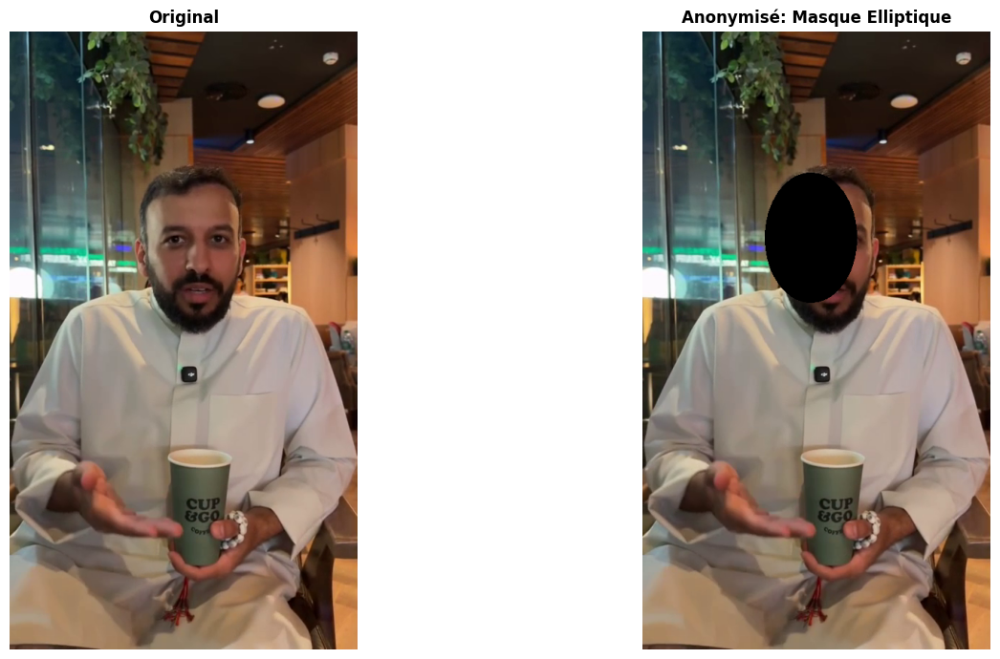

 Méthode 4 (Mask): Masquage géométrique simple


In [36]:
# Masque avec forme géométrique (ellipse)
frame_masked = frame_rgb.copy()

for face in faces:
    bbox = face.bbox.astype(int)
    x1, y1, x2, y2 = bbox
    
    # Centre et axes de l'ellipse
    center_x = (x1 + x2) // 2
    center_y = (y1 + y2) // 2
    axis_x = (x2 - x1) // 2
    axis_y = (y2 - y1) // 2
    
    # Dessiner une ellipse noire
    cv2.ellipse(frame_masked, (center_x, center_y), (axis_x, axis_y), 
                0, 0, 360, (0, 0, 0), -1)

plt.figure(figsize=(16, 7))

plt.subplot(1, 2, 1)
plt.imshow(frame_rgb)
plt.title("Original", fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(frame_masked)
plt.title("Anonymisé: Masque Elliptique", fontsize=12, fontweight='bold')
plt.axis('off')

plt.tight_layout()
plt.show()

print(" Méthode 4 (Mask): Masquage géométrique simple")

 Traitement de 6 frames avec Masque Elliptique...


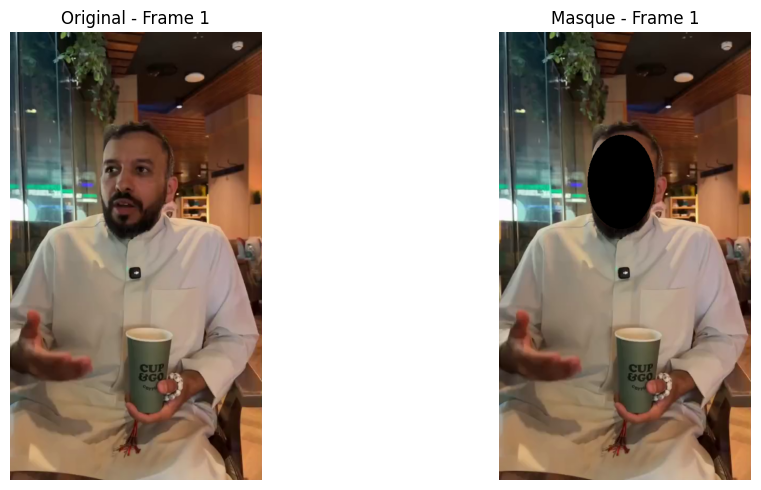

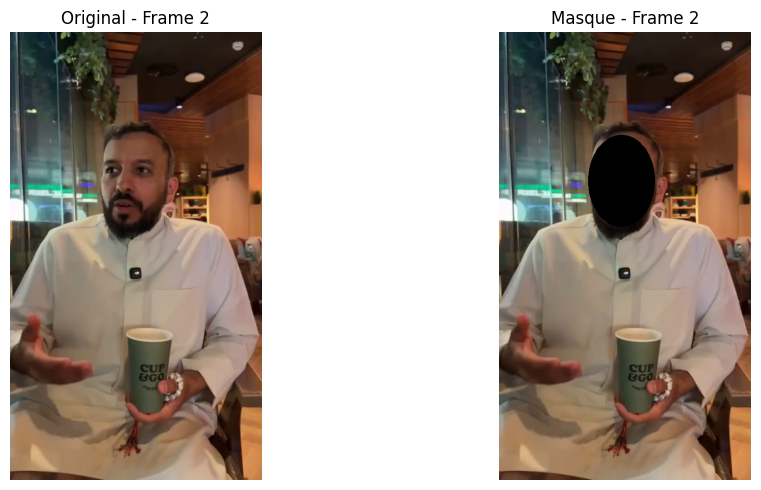

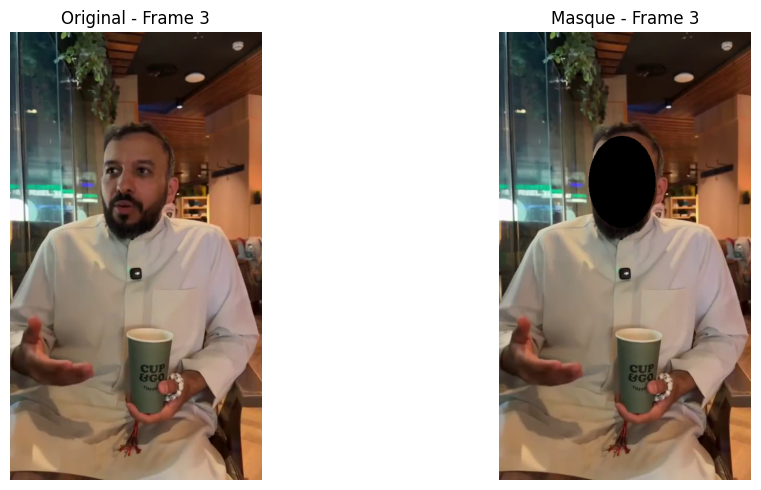

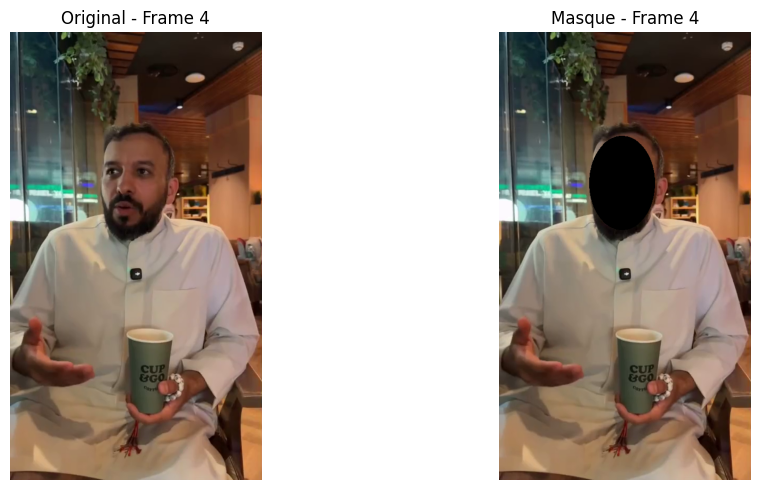

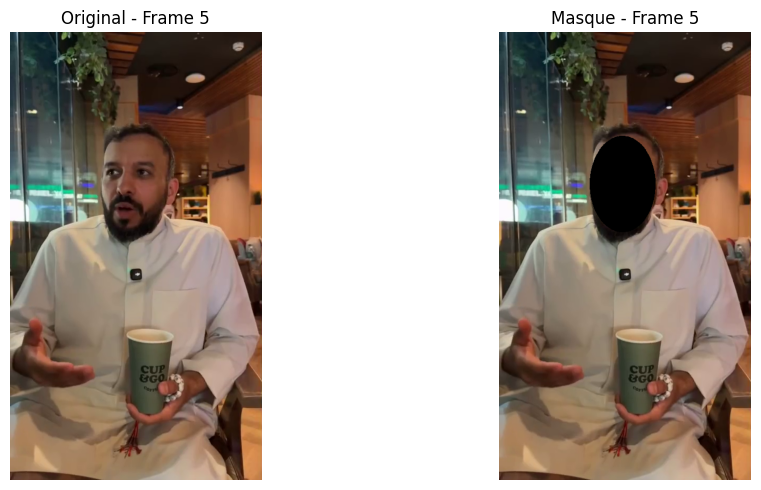

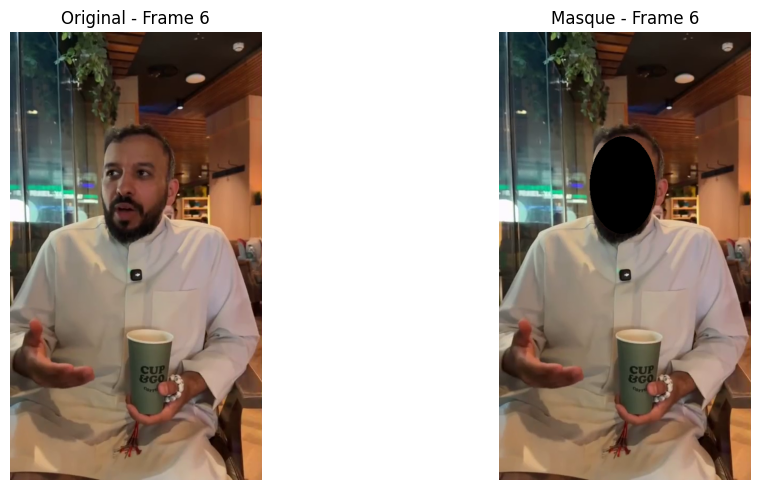

6 frames traitees avec succes


In [37]:
# Traiter une séquence avec Masque
cap = cv2.VideoCapture(video_path)
frames_masked_seq = []

print(f" Traitement de {num_frames} frames avec Masque Elliptique...")

for i in range(num_frames):
    ret, frame = cap.read()
    if not ret:
        break
    
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Appliquer masque
    frame_mask = frame_rgb.copy()
    faces_seq = app.get(frame_rgb)
    
    for face in faces_seq:
        bbox = face.bbox.astype(int)
        x1, y1, x2, y2 = bbox
        center_x = (x1 + x2) // 2
        center_y = (y1 + y2) // 2
        axis_x = (x2 - x1) // 2
        axis_y = (y2 - y1) // 2
        cv2.ellipse(frame_mask, (center_x, center_y), (axis_x, axis_y), 
                    0, 0, 360, (0, 0, 0), -1)
    
    frames_masked_seq.append(frame_mask)

cap.release()

# Visualisation cote a cote
for i in range(num_frames):
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(frames_original[i])
    plt.title(f"Original - Frame {i+1}")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(frames_masked_seq[i])
    plt.title(f"Masque - Frame {i+1}")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

print(f"{len(frames_masked_seq)} frames traitees avec succes")

####  Test sur Séquence Vidéo: Masque Elliptique

Application du masque sur plusieurs frames

In [38]:
# Creer et sauvegarder une video complete avec Masque
output_video_mask = str(output_dir / "video3_masked.mp4")

cap = cv2.VideoCapture(video_path)
out = cv2.VideoWriter(output_video_mask, fourcc, fps, (width, height))

print(f"Creation de la video avec Masque...")
frame_count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break
    
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    faces_detected = app.get(frame_rgb)
    
    # Appliquer masque
    for face in faces_detected:
        bbox = face.bbox.astype(int)
        x1, y1, x2, y2 = bbox
        center_x = (x1 + x2) // 2
        center_y = (y1 + y2) // 2
        axis_x = (x2 - x1) // 2
        axis_y = (y2 - y1) // 2
        cv2.ellipse(frame_rgb, (center_x, center_y), (axis_x, axis_y), 
                    0, 0, 360, (0, 0, 0), -1)
    
    frame_bgr = cv2.cvtColor(frame_rgb, cv2.COLOR_RGB2BGR)
    out.write(frame_bgr)
    frame_count += 1

cap.release()
out.release()

print(f"Video creee: {output_video_mask} ({frame_count} frames)")

Creation de la video avec Masque...
Video creee: output_videos\video3_masked.mp4 (79 frames)


##  5. Filtres Temporels pour Cohérence Vidéo

**Objectif:** Réduire le scintillement entre frames, améliorer la fluidité

In [39]:
# Démonstration des 4 filtres temporels
print(" Filtres Temporels Disponibles:\n")

filters_info = {
    'moving_average': {
        'description': 'Moyenne glissante sur N frames',
        'usage': 'Lissage général, bon pour scènes statiques',
        'params': 'window_size=5'
    },
    'exponential': {
        'description': 'Lissage exponentiel (alpha blending)',
        'usage': 'Plus réactif, adapté aux transitions',
        'params': 'alpha=0.3'
    },
    'kalman': {
        'description': 'Filtre prédictif de Kalman',
        'usage': 'Prédiction basée sur mouvement',
        'params': 'process_noise, measurement_noise'
    },
    'adaptive': {
        'description': 'Adaptatif selon mouvement détecté',
        'usage': 'S\'ajuste automatiquement au niveau de mouvement',
        'params': 'low_motion_alpha=0.7, high_motion_alpha=0.2'
    }
}

for i, (name, info) in enumerate(filters_info.items(), 1):
    print(f"{i}. {name.upper()}")
    print(f"    {info['description']}")
    print(f"    Usage: {info['usage']}")
    print(f"    Paramètres: {info['params']}")
    print()

# Créer des instances avec les bons paramètres
filter_ma = TemporalFilter(method='moving_average', window_size=5)
filter_exp = TemporalFilter(method='exponential', window_size=5)
filter_kalman = TemporalFilter(method='kalman', window_size=5)
filter_adaptive = AdaptiveTemporalFilter(low_motion_alpha=0.7, high_motion_alpha=0.2)

print(" Tous les filtres temporels initialisés!")
print("\n Utilisation: filter.apply(frame) pour lisser une frame")

 Filtres Temporels Disponibles:

1. MOVING_AVERAGE
    Moyenne glissante sur N frames
    Usage: Lissage général, bon pour scènes statiques
    Paramètres: window_size=5

2. EXPONENTIAL
    Lissage exponentiel (alpha blending)
    Usage: Plus réactif, adapté aux transitions
    Paramètres: alpha=0.3

3. KALMAN
    Filtre prédictif de Kalman
    Usage: Prédiction basée sur mouvement
    Paramètres: process_noise, measurement_noise

4. ADAPTIVE
    Adaptatif selon mouvement détecté
    Usage: S'ajuste automatiquement au niveau de mouvement
    Paramètres: low_motion_alpha=0.7, high_motion_alpha=0.2

 Tous les filtres temporels initialisés!

 Utilisation: filter.apply(frame) pour lisser une frame


 Application des 4 filtres temporels sur 6 frames...


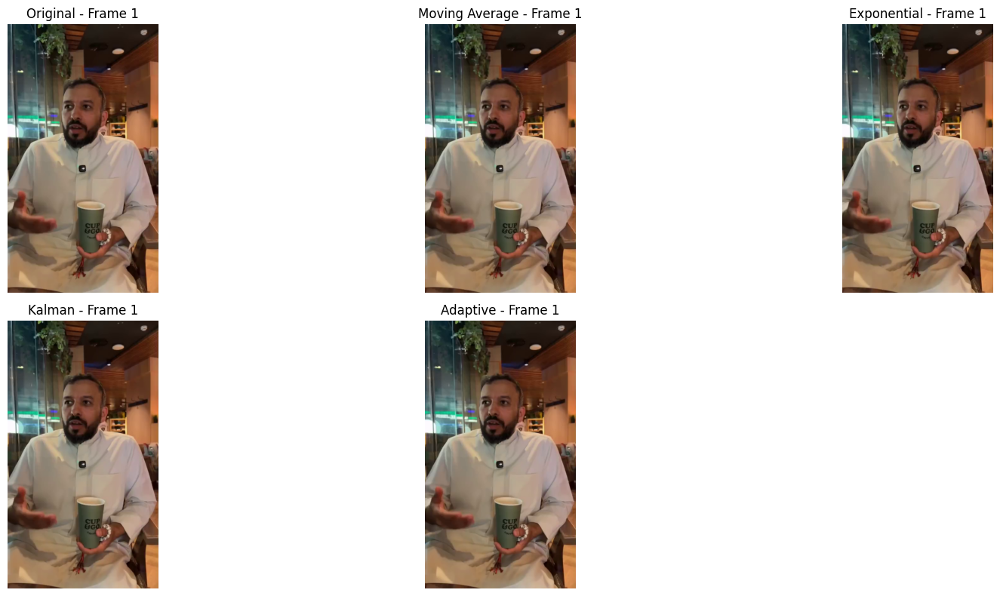

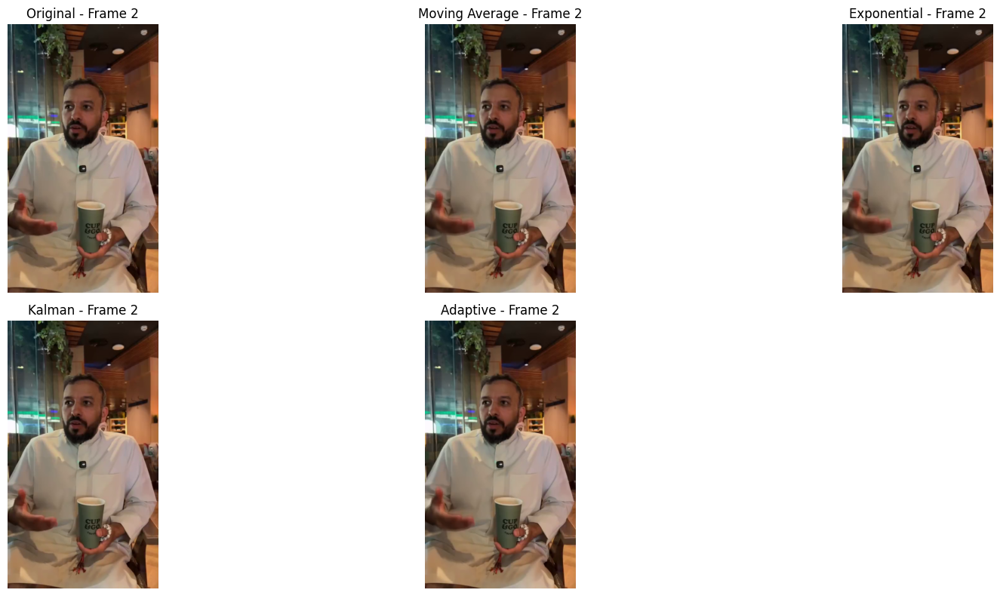

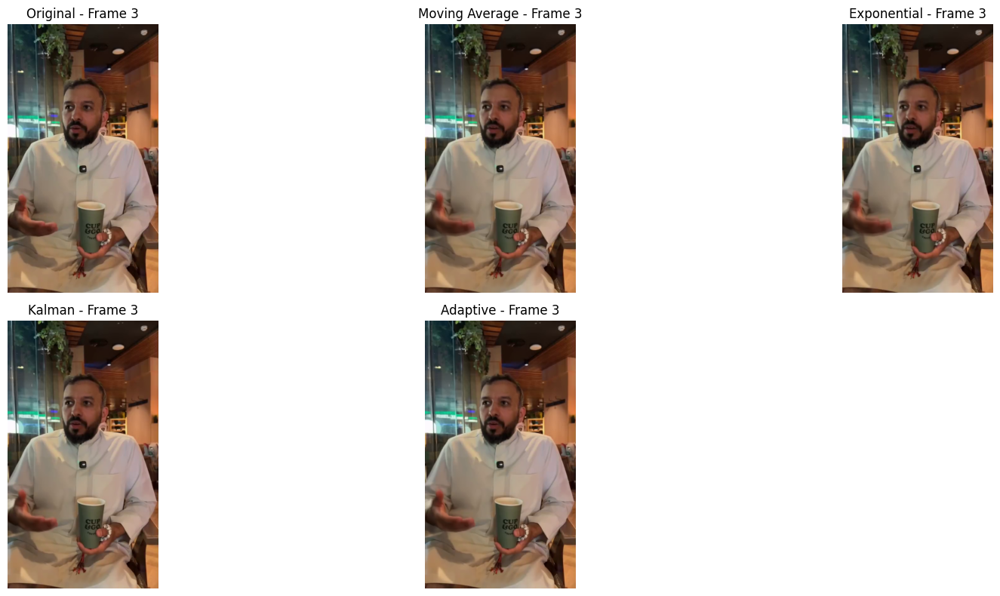

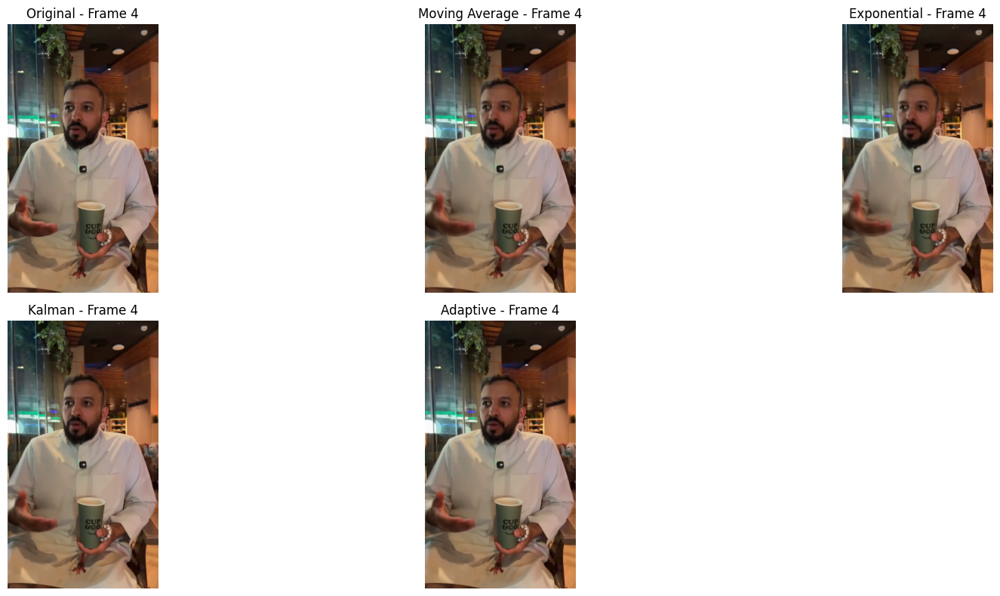

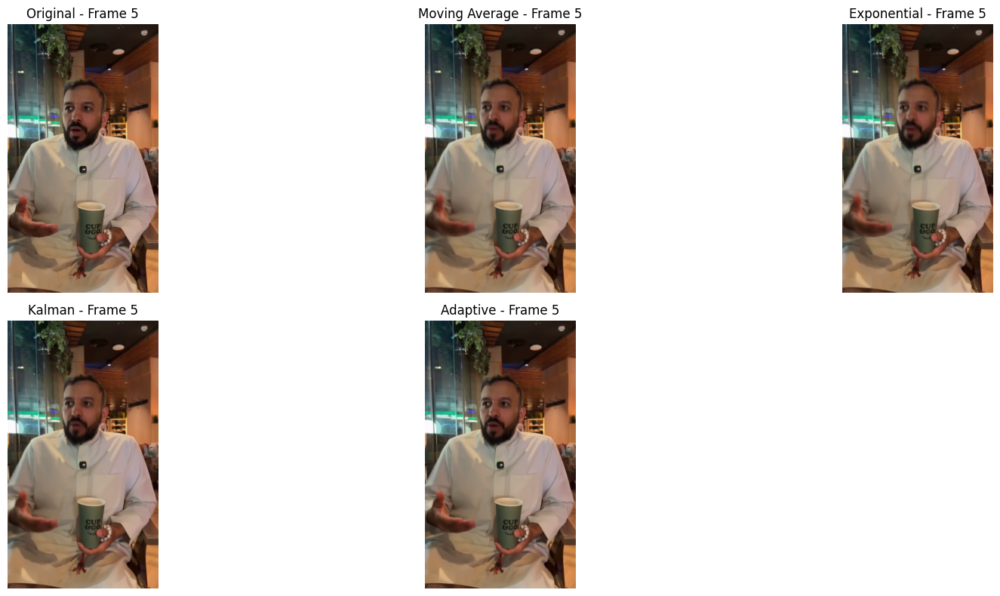

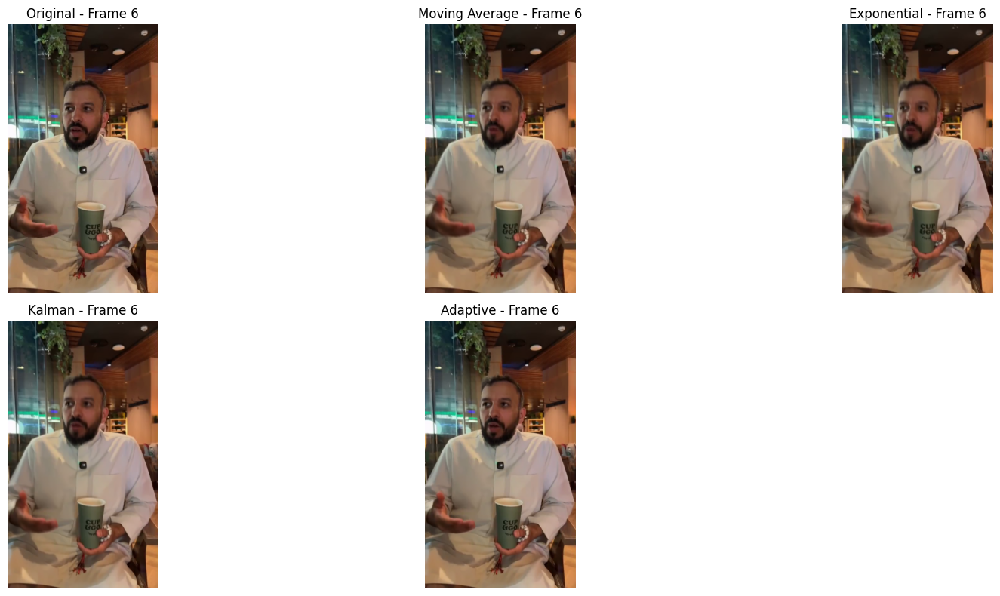

Filtres appliques avec succes


In [40]:
# Traiter une séquence avec les 4 filtres temporels
cap = cv2.VideoCapture(video_path)

# Réinitialiser les filtres
filter_ma.reset()
filter_exp.reset()
filter_kalman.reset()
filter_adaptive.reset()

frames_filtered = {
    'Original': [],
    'Moving Average': [],
    'Exponential': [],
    'Kalman': [],
    'Adaptive': []
}

print(f" Application des 4 filtres temporels sur {num_frames} frames...")

for i in range(num_frames):
    ret, frame = cap.read()
    if not ret:
        break
    
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frames_filtered['Original'].append(frame_rgb)
    
    # Appliquer chaque filtre
    frames_filtered['Moving Average'].append(filter_ma.apply(frame_rgb))
    frames_filtered['Exponential'].append(filter_exp.apply(frame_rgb))
    frames_filtered['Kalman'].append(filter_kalman.apply(frame_rgb))
    frames_filtered['Adaptive'].append(filter_adaptive.apply(frame_rgb))

cap.release()

# Visualisation cote a cote pour chaque frame
filter_names = ['Original', 'Moving Average', 'Exponential', 'Kalman', 'Adaptive']

for col in range(num_frames):
    plt.figure(figsize=(18, 8))
    
    for row, filter_name in enumerate(filter_names):
        plt.subplot(2, 3, row + 1)
        plt.imshow(frames_filtered[filter_name][col])
        plt.title(f"{filter_name} - Frame {col+1}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

print("Filtres appliques avec succes")

####  Test sur Séquence Vidéo: Filtres Temporels

Comparaison de l'effet de lissage des 4 filtres sur une séquence

##  6. Anonymisation Audio 

Transformation vocale avec FFmpeg pour rendre la voix non reconnaissable

Modes:

**1. pitch** - Voix plus aiguë (+5 demi-tons)

Utilisation: Homme → Voix plus féminine

**2. pitch-down** - Voix plus grave (-5 demi-tons)

Utilisation: Femme → Voix plus masculine

**3. robot** - Effet robotique/vocoder

Utilisation: Anonymisation complète avec effet futuriste

**4. distort** - Distorsion audio

Utilisation: Effet "téléphone" ou "radio"

**5. speed** - Accélération (1.3x)

**6. speed-down** - Ralentissement (0.8x)

**7. remove** - Suppression complète

### Test: Création Vidéo avec Audio Robot

In [68]:
from audio_anonymizer_v2 import AudioAnonymizerV2

output_video_audio = str(output_dir / "video3_audio.mp4")

audio_anonymizer_v2 = AudioAnonymizerV2()
audio_anonymizer_v2.anonymize_audio(
    video_path=video_path,
    output_path=output_video_audio,
    mode='robot'
)

print(f"Video avec audio robot cree: {output_video_audio}")


   Mode d'anonymisation audio: robot
   Extraction audio...
   Voix robotique (vocoder)
   Combinaison audio + vidéo...
Video avec audio robot cree: output_videos\video3_audio.mp4


##  7. Métriques de Qualité

Évaluation quantitative de l'impact de l'anonymisation

 Métriques de Qualité (par rapport à l'original):

Méthode         | MSE          | PSNR (dB)    | SSIM    
------------------------------------------------------------
Blur            |     366.52  |      22.49  | 0.7183
Pixelate        |    1193.44  |      17.36  | 0.5012
Face Swap       |    1251.21  |      17.16  | 0.4971
Mask            |    1483.93  |      16.42  | 0.4777


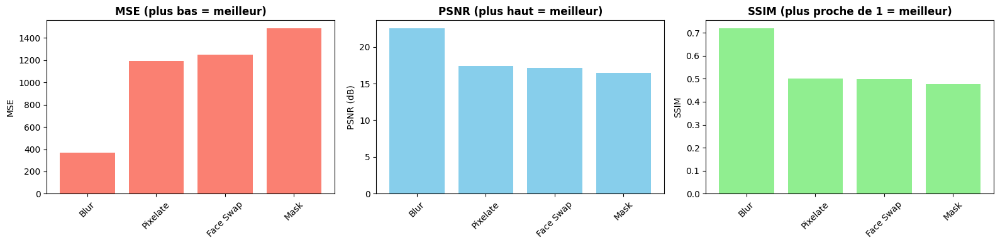

In [42]:
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio, structural_similarity

# Calculer les métriques pour chaque méthode
methods = {
    'Blur': frame_blurred,
    'Pixelate': frame_pixelated,
    'Face Swap': frame_swapped_basic,
    'Mask': frame_masked
}

metrics_results = []

print(" Métriques de Qualité (par rapport à l'original):\n")
print(f"{'Méthode':<15} | {'MSE':<12} | {'PSNR (dB)':<12} | {'SSIM':<8}")
print("-" * 60)

for method_name, method_frame in methods.items():
    # MSE: Mean Squared Error (plus bas = plus similaire)
    mse = mean_squared_error(frame_rgb, method_frame)
    
    # PSNR: Peak Signal-to-Noise Ratio (plus haut = meilleure qualité)
    psnr = peak_signal_noise_ratio(frame_rgb, method_frame)
    
    # SSIM: Structural Similarity Index (0-1, plus haut = plus similaire)
    ssim = structural_similarity(frame_rgb, method_frame, channel_axis=2)
    
    metrics_results.append({
        'method': method_name,
        'mse': mse,
        'psnr': psnr,
        'ssim': ssim
    })
    
    print(f"{method_name:<15} | {mse:>10.2f}  | {psnr:>10.2f}  | {ssim:>6.4f}")

# Visualisation graphique
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

methods_names = [m['method'] for m in metrics_results]
mse_values = [m['mse'] for m in metrics_results]
psnr_values = [m['psnr'] for m in metrics_results]
ssim_values = [m['ssim'] for m in metrics_results]

# MSE
axes[0].bar(methods_names, mse_values, color='salmon')
axes[0].set_title('MSE (plus bas = meilleur)', fontweight='bold')
axes[0].set_ylabel('MSE')
axes[0].tick_params(axis='x', rotation=45)

# PSNR
axes[1].bar(methods_names, psnr_values, color='skyblue')
axes[1].set_title('PSNR (plus haut = meilleur)', fontweight='bold')
axes[1].set_ylabel('PSNR (dB)')
axes[1].tick_params(axis='x', rotation=45)

# SSIM
axes[2].bar(methods_names, ssim_values, color='lightgreen')
axes[2].set_title('SSIM (plus proche de 1 = meilleur)', fontweight='bold')
axes[2].set_ylabel('SSIM')
axes[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

##  8. Analyse Vidéo: Comparaisons Visuelles

Outils pour visualiser les transformations

 Modes d'Analyse Disponibles:

  • side_by_side    : Comparaison côte à côte (Original | Anonymisé)
  • difference      : Carte de différence (heatmap des changements)
  • grid            : Vue en grille avec histogrammes RGB
  • overlay         : Superposition avec transparence réglable


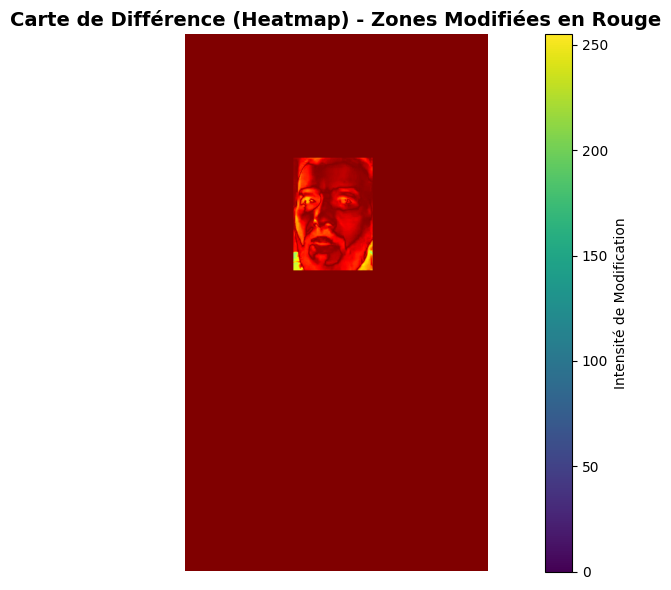

In [ ]:
print(" Modes d'Analyse Disponibles:\n")

analysis_modes = {
    'side_by_side': 'Comparaison côte à côte (Original | Anonymisé)',
    'difference': 'Carte de différence (heatmap des changements)',
    'grid': 'Vue en grille avec histogrammes RGB',
    'overlay': 'Superposition avec transparence réglable'
}

for mode, description in analysis_modes.items():
    print(f"  • {mode:15s} : {description}")

# Créer un analyseur
analyzer = VideoAnalyzer()

# Carte de différence (heatmap)
diff_map = analyzer.create_difference_map(frame_rgb, frame_swapped_preserved)

plt.figure(figsize=(12, 6))
plt.imshow(diff_map)
plt.title("Carte de Différence (Heatmap) - Zones Modifiées en Rouge", fontsize=14, fontweight='bold')
plt.colorbar(label='Intensité de Modification')
plt.axis('off')
plt.tight_layout()
plt.show()


---

## Conclusion: Vidéo Complète avec Face Swap + Filtre + Audio

Application combinée de toutes les techniques sur video5.mp4

In [71]:
from temporal_filter import TemporalFilter
from audio_anonymizer_v2 import AudioAnonymizerV2

video5_path = "input_videos/video5.mp4"
face9_path = "face_dataset/face9.jpg"
output_video5_temp = str(output_dir / "temp_video5_no_audio.mp4")
output_video5_final = str(output_dir / "video5_complete.mp4")

cap5 = cv2.VideoCapture(video5_path)
fps5 = int(cap5.get(cv2.CAP_PROP_FPS))
width5 = int(cap5.get(cv2.CAP_PROP_FRAME_WIDTH))
height5 = int(cap5.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc5 = cv2.VideoWriter_fourcc(*'mp4v')

ref_img9 = cv2.imread(face9_path)
ref_img9_rgb = cv2.cvtColor(ref_img9, cv2.COLOR_BGR2RGB)
ref_faces9 = app.get(ref_img9_rgb)
if len(ref_faces9) == 0:
    print(f"Aucun visage detecte dans {face9_path}")
else:
    ref_face9 = ref_faces9[0]
    print(f"Visage de reference charge depuis {face9_path}")

out5 = cv2.VideoWriter(output_video5_temp, fourcc5, fps5, (width5, height5))
filter_temp5 = TemporalFilter(method='moving_average', window_size=5)

print(f"\nTraitement de {video5_path}...")
frame_count = 0

while True:
    ret, frame = cap5.read()
    if not ret:
        break
    
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Détecter les visages
    faces = app.get(frame_rgb)
    
    # Appliquer face swap
    frame_result = frame_rgb.copy()
    if len(faces) > 0 and len(ref_faces9) > 0:
        frame_result = swapper.get(frame_result, faces[0], ref_face9, paste_back=True)
    
    # Appliquer le filtre temporel sur la frame (pas sur les faces!)
    frame_filtered = filter_temp5.apply(frame_result)
    
    # Convertir en BGR et écrire
    frame_bgr = cv2.cvtColor(frame_filtered.astype(np.uint8), cv2.COLOR_RGB2BGR)
    out5.write(frame_bgr)
    frame_count += 1
    
    if frame_count % 10 == 0:
        print(f"Traite: {frame_count} frames...")

out5.release()
cap5.release()

print(f"\nVideo temporaire creee: {output_video5_temp} ({frame_count} frames)")

# Anonymisation audio
audio_anonymizer5 = AudioAnonymizerV2()
audio_anonymizer5.anonymize_audio(
    video_path=output_video5_temp,  
    output_path=output_video5_final,
    mode='robot'
)

print(f"\nVideo complete creee: {output_video5_final}")
print(f"- Face swap avec face9.jpg")
print(f"- Filtre temporel moving average")
print(f"- Audio robot")

Visage de reference charge depuis face_dataset/face9.jpg

Traitement de input_videos/video5.mp4...
Traite: 10 frames...
Traite: 20 frames...
Traite: 30 frames...
Traite: 40 frames...
Traite: 50 frames...
Traite: 60 frames...
Traite: 70 frames...
Traite: 80 frames...
Traite: 90 frames...
Traite: 100 frames...
Traite: 110 frames...
Traite: 120 frames...
Traite: 130 frames...
Traite: 140 frames...
Traite: 150 frames...
Traite: 160 frames...
Traite: 170 frames...
Traite: 180 frames...
Traite: 190 frames...
Traite: 200 frames...
Traite: 210 frames...
Traite: 220 frames...
Traite: 230 frames...
Traite: 240 frames...
Traite: 250 frames...
Traite: 260 frames...
Traite: 270 frames...
Traite: 280 frames...
Traite: 290 frames...
Traite: 300 frames...
Traite: 310 frames...
Traite: 320 frames...
Traite: 330 frames...
Traite: 340 frames...

Video temporaire creee: output_videos\temp_video5_no_audio.mp4 (345 frames)

   Mode d'anonymisation audio: robot
   Extraction audio...
   ERREUR: FFmpeg extrac

---

##  Références et Ressources

### Papers & Modèles
- **InsightFace:** [https://github.com/deepinsight/insightface](https://github.com/deepinsight/insightface)
- **Inswapper:** Face swap with GAN-based model
- **Buffalo_L:** Multi-task face recognition model

### Documentation
- **Project README:** Voir README.md dans le repository
- **Challenges:** CLOTHES_ANONYMIZATION_CHALLENGES.md
- **Requirements:** requirements.txt pour installation

### Contact
- **GitHub:** [ranemori/videoAnonymization](https://github.com/ranemori/videoAnonymization)

---

*Notebook créé le 30 Décembre 2025*